## PROBLEM STATEMENT

The goal of this project is to develop a predictive model to identify customers who are likely to default on home loans based on their financial history, credit behavior, and loan repayment patterns. By analyzing multiple datasets, we aim to extract key risk factors and build an accurate classification model. This will help financial institutions make better loan approval decisions and reduce default risk.

### ANALYZING DATASETS AND MERGING

As we have 7 different datasets as given below:

●	application_train.csv
	The main file which contains the Target(1:Defaulter ; 0: Not Defaulter)
	Static data for all applications. One row represents one loan in our data sample.

●	bureau.csv
	All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
	For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

●	bureau_balance.csv
	Monthly balances of previous credits in Credit Bureau.
	This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.

●	POS_CASH_balance.csv
	Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
	This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.

●	credit_card_balance.csv
	Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
	This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.

●	previous_application.csv
	All previous applications for Home Credit loans of clients who have loans in our sample.
	There is one row for each previous application related to loans in our data sample.
  
  ●	installments_payments.csv
	Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
	There is a one row for every payment that was made plus b) one row each for missed payment.
	One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Load the Datasets
def load_data():
    application_train = pd.read_csv("application_train.csv")
    bureau = pd.read_csv("bureau.csv")
    bureau_balance = pd.read_csv("bureau_balance.csv")
    pos_cash = pd.read_csv("POS_CASH_balance.csv")
    credit_card = pd.read_csv("credit_card_balance.csv")
    previous_application = pd.read_csv("previous_application.csv")
    installments = pd.read_csv("installments_payments.csv")
    return application_train, bureau, bureau_balance, pos_cash, credit_card, previous_application, installments

In [5]:
# Load datasets
application_train, bureau, bureau_balance, pos_cash, credit_card, previous_application, installments = load_data()

In [7]:
# Aggregate bureau data
def aggregate_bureau(bureau):
    bureau_agg = bureau.groupby("SK_ID_CURR").agg({
        "AMT_CREDIT_SUM": "sum",
        "CREDIT_DAY_OVERDUE": "max",
        "DAYS_CREDIT": "mean"
    }).reset_index()
    return bureau_agg

In [9]:
#Merging into the main datset
bureau_agg = aggregate_bureau(bureau)
application_train = application_train.merge(bureau_agg, on="SK_ID_CURR", how="left")

In [11]:
# Aggregate POS_CASH data
def aggregate_pos_cash(pos_cash):
    pos_cash_agg = pos_cash.groupby("SK_ID_CURR").agg({
        "SK_DPD": "max",  # Maximum days past due
        "CNT_INSTALMENT_FUTURE": "sum"  # Total remaining installments
    }).reset_index()
    return pos_cash_agg

In [13]:
#Merging into the main datset
pos_cash_agg = aggregate_pos_cash(pos_cash)
application_train = application_train.merge(pos_cash_agg, on="SK_ID_CURR", how="left")

In [15]:
# Aggregate credit card data
def aggregate_credit_card(credit_card):
    credit_card_agg = credit_card.groupby("SK_ID_CURR").agg({
        "AMT_BALANCE": "sum",  # Total credit card balance
        "SK_DPD": "max"  # Maximum past due days
    }).reset_index()
    return credit_card_agg

In [17]:
#Merging into the main datset
credit_card_agg = aggregate_credit_card(credit_card)
application_train = application_train.merge(credit_card_agg, on="SK_ID_CURR", how="left")

In [19]:
# Aggregate previous applications
def aggregate_previous_app(previous_application):
    prev_app_agg = previous_application.groupby("SK_ID_CURR").agg({
        "AMT_CREDIT": "sum",  # Total credit amount applied in past
        "NAME_CONTRACT_STATUS": "count"  # Number of past applications
    }).reset_index()
    return prev_app_agg

In [21]:
#Merging into the main datset
prev_app_agg = aggregate_previous_app(previous_application)
application_train = application_train.merge(prev_app_agg, on="SK_ID_CURR", how="left")

In [23]:
# Aggregate installments payments
def aggregate_installments(installments):
    installments_agg = installments.groupby("SK_ID_CURR").agg({
        "AMT_PAYMENT": "sum",  # Total amount paid in installments
        "DAYS_ENTRY_PAYMENT": "mean"  # Average days delay in payments
    }).reset_index()
    return installments_agg

In [25]:
#Merging into the main datset
installments_agg = aggregate_installments(installments)
application_train = application_train.merge(installments_agg, on="SK_ID_CURR", how="left")

In [27]:
# Final dataset is now merged and ready for model training
application_train.to_csv("final_merged_dataset.csv", index=False)

In [28]:
# Load the merged dataset
data = pd.read_csv("final_merged_dataset.csv")

In [29]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY,...,CREDIT_DAY_OVERDUE,DAYS_CREDIT,SK_DPD_x,CNT_INSTALMENT_FUTURE,AMT_BALANCE,SK_DPD_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,AMT_PAYMENT,DAYS_ENTRY_PAYMENT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,-874.000000,0.0,285.0,NaN,NaN,179055.0,1.0,219625.695,-315.421053
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,-1400.750000,0.0,162.0,NaN,NaN,1452573.0,3.0,1618864.650,-1385.320000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,-867.000000,0.0,9.0,NaN,NaN,20106.0,1.0,21288.465,-761.666667
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,NaN,NaN,0.0,173.0,0.0,0.0,2625259.5,9.0,1007153.415,-271.625000
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,-1149.000000,0.0,592.0,NaN,NaN,999832.5,6.0,806127.975,-1032.242424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,NaN,NaN,0.0,35.0,NaN,NaN,40455.0,1.0,52450.470,-156.285714
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,NaN,NaN,0.0,21.0,NaN,NaN,56821.5,1.0,60419.205,-2393.833333
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0.0,-867.500000,5.0,34.0,NaN,NaN,41251.5,2.0,57622.815,-2387.428571
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.0,-1104.000000,0.0,207.0,NaN,NaN,268879.5,2.0,194556.825,-161.263158


## Task 1:-Prepare a complete data analysis report on the given data.¶

### Basic Checks

In [35]:
data.columns  #Total 133 columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY',
       ...
       'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT', 'SK_DPD_x',
       'CNT_INSTALMENT_FUTURE', 'AMT_BALANCE', 'SK_DPD_y', 'AMT_CREDIT_y',
       'NAME_CONTRACT_STATUS', 'AMT_PAYMENT', 'DAYS_ENTRY_PAYMENT'],
      dtype='object', length=133)

In [37]:
data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY,...,CREDIT_DAY_OVERDUE,DAYS_CREDIT,SK_DPD_x,CNT_INSTALMENT_FUTURE,AMT_BALANCE,SK_DPD_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,AMT_PAYMENT,DAYS_ENTRY_PAYMENT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.0,-874.00,0.0,285.0,NaN,NaN,179055.0,1.0,219625.695,-315.421053
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,-1400.75,0.0,162.0,NaN,NaN,1452573.0,3.0,1618864.650,-1385.320000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,-867.00,0.0,9.0,NaN,NaN,20106.0,1.0,21288.465,-761.666667
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,NaN,NaN,0.0,173.0,0.0,0.0,2625259.5,9.0,1007153.415,-271.625000
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,-1149.00,0.0,592.0,NaN,NaN,999832.5,6.0,806127.975,-1032.242424


In [39]:
data.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY,...,CREDIT_DAY_OVERDUE,DAYS_CREDIT,SK_DPD_x,CNT_INSTALMENT_FUTURE,AMT_BALANCE,SK_DPD_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,AMT_PAYMENT,DAYS_ENTRY_PAYMENT
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,NaN,NaN,0.0,35.0,NaN,NaN,40455.0,1.0,52450.470,-156.285714
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,NaN,NaN,0.0,21.0,NaN,NaN,56821.5,1.0,60419.205,-2393.833333
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0.0,-867.500000,5.0,34.0,NaN,NaN,41251.5,2.0,57622.815,-2387.428571
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.0,-1104.000000,0.0,207.0,NaN,NaN,268879.5,2.0,194556.825,-161.263158
307510,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,0.0,-1089.454545,5.0,1075.0,NaN,NaN,3395448.0,8.0,3525819.975,-472.013514


In [41]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 133 entries, SK_ID_CURR to DAYS_ENTRY_PAYMENT
dtypes: float64(76), int64(41), object(16)
memory usage: 312.0+ MB


In [43]:
data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,CREDIT_DAY_OVERDUE,DAYS_CREDIT,SK_DPD_x,CNT_INSTALMENT_FUTURE,AMT_BALANCE,SK_DPD_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,AMT_PAYMENT,DAYS_ENTRY_PAYMENT
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,263491.000000,263491.000000,289444.000000,289444.000000,8.690500e+04,86905.000000,2.910570e+05,291057.000000,2.916430e+05,291635.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,4.772759,-1083.047110,15.697644,308.190013,2.194196e+06,16.953501,9.537162e+05,4.857128,6.785854e+05,-920.961181
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,89.141274,563.327298,153.169246,380.256420,3.266996e+06,143.567107,1.486623e+06,4.147042,9.161681e+05,597.024650
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,-2922.000000,0.000000,0.000000,-1.260000e+05,0.000000,0.000000e+00,1.000000,0.000000e+00,-3071.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,-1434.000000,0.000000,72.000000,0.000000e+00,0.000000,1.571985e+05,2.000000,1.308270e+05,-1311.842195
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,-1050.571429,0.000000,163.000000,7.385753e+05,0.000000,4.277880e+05,4.000000,3.186195e+05,-807.581818
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,-663.763889,0.000000,393.000000,3.075180e+06,0.000000,1.158408e+06,6.000000,8.330939e+05,-431.609963
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,2792.000000,0.000000,4231.000000,5539.000000,2.998048e+07,2831.000000,4.146113e+07,73.000000,2.553705e+07,-3.000000


In [44]:
data.describe(include='O')

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


### Data Cleaning

In [48]:
#To clearly understand our attributes and drop unnecessary columns
columns_list = data.columns.tolist()
print(columns_list)

['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'E

In [50]:
duplicate_rows = data[data.duplicated()]
print(duplicate_rows)
#By this we got to know that our dataset does not have duplicate rows

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_MOBIL, FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY, ORGANIZATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, L

In [52]:
columns_to_drop = [
    'SK_ID_CURR',
    'APARTMENTS_AVG', 'APARTMENTS_MODE',
    'BASEMENTAREA_AVG', 'BASEMENTAREA_MODE',
    'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE',
    'YEARS_BUILD_AVG', 'YEARS_BUILD_MODE',
    'COMMONAREA_AVG', 'COMMONAREA_MODE',
    'ELEVATORS_AVG', 'ELEVATORS_MODE',
    'ENTRANCES_AVG', 'ENTRANCES_MODE',
    'FLOORSMAX_AVG', 'FLOORSMAX_MODE',
    'FLOORSMIN_AVG', 'FLOORSMIN_MODE',
    'LANDAREA_AVG', 'LANDAREA_MODE',
    'LIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_MODE',
    'LIVINGAREA_AVG', 'LIVINGAREA_MODE',
    'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_MODE',
    'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MODE',
    'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE',
    'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
    'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
    'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
    'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17',
    'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
    'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
    'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
    'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'
]
df_cleaned = data.drop(columns=columns_to_drop)

# Save the cleaned dataset
df_cleaned.to_csv("cleaned_dataset.csv", index=False)
print("Dataset cleaned and saved as 'cleaned_dataset.csv'")

Dataset cleaned and saved as 'cleaned_dataset.csv'


In [53]:
# Load the cleaned dataset
data = pd.read_csv("cleaned_dataset.csv")

In [56]:
data   #checking whether data is cleaned or not

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY,AMT_GOODS_PRICE,...,CREDIT_DAY_OVERDUE,DAYS_CREDIT,SK_DPD_x,CNT_INSTALMENT_FUTURE,AMT_BALANCE,SK_DPD_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,AMT_PAYMENT,DAYS_ENTRY_PAYMENT
0,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,...,0.0,-874.000000,0.0,285.0,NaN,NaN,179055.0,1.0,219625.695,-315.421053
1,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,0.0,-1400.750000,0.0,162.0,NaN,NaN,1452573.0,3.0,1618864.650,-1385.320000
2,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,...,0.0,-867.000000,0.0,9.0,NaN,NaN,20106.0,1.0,21288.465,-761.666667
3,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,NaN,NaN,0.0,173.0,0.0,0.0,2625259.5,9.0,1007153.415,-271.625000
4,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,0.0,-1149.000000,0.0,592.0,NaN,NaN,999832.5,6.0,806127.975,-1032.242424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,...,NaN,NaN,0.0,35.0,NaN,NaN,40455.0,1.0,52450.470,-156.285714
307507,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,...,NaN,NaN,0.0,21.0,NaN,NaN,56821.5,1.0,60419.205,-2393.833333
307508,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,...,0.0,-867.500000,5.0,34.0,NaN,NaN,41251.5,2.0,57622.815,-2387.428571
307509,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,319500.0,...,0.0,-1104.000000,0.0,207.0,NaN,NaN,268879.5,2.0,194556.825,-161.263158


In [58]:
data.columns

Index(['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT_x',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'APARTMENTS_MEDI',

In [60]:
data.isnull().sum()

TARGET                       0
NAME_CONTRACT_TYPE           0
CODE_GENDER                  0
FLAG_OWN_CAR                 0
FLAG_OWN_REALTY              0
                         ...  
SK_DPD_y                220606
AMT_CREDIT_y             16454
NAME_CONTRACT_STATUS     16454
AMT_PAYMENT              15868
DAYS_ENTRY_PAYMENT       15876
Length: 74, dtype: int64

In [62]:
#To get know only the columns that have null values
missing_values = data.isnull().sum()
missing_values = missing_values[missing_values > 0]
print(missing_values)

AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
OWN_CAR_AGE                     202929
OCCUPATION_TYPE                  96391
CNT_FAM_MEMBERS                      2
EXT_SOURCE_1                    173378
EXT_SOURCE_2                       660
EXT_SOURCE_3                     60965
APARTMENTS_MEDI                 156061
BASEMENTAREA_MEDI               179943
YEARS_BEGINEXPLUATATION_MEDI    150007
YEARS_BUILD_MEDI                204488
COMMONAREA_MEDI                 214865
ELEVATORS_MEDI                  163891
ENTRANCES_MEDI                  154828
FLOORSMAX_MEDI                  153020
FLOORSMIN_MEDI                  208642
LANDAREA_MEDI                   182590
LIVINGAPARTMENTS_MEDI           210199
LIVINGAREA_MEDI                 154350
NONLIVINGAPARTMENTS_MEDI        213514
NONLIVINGAREA_MEDI              169682
TOTALAREA_MODE                  148431
OBS_30_CNT_SOCIAL_CIRCLE          1021
DEF_30_CNT_SOCIAL_CIRCLE 

In [64]:
#For numerical columns fill with median
for col in data.select_dtypes(include=['number']).columns:
    data[col].fillna(data[col].median(), inplace=True)  # Fill numerical NaNs with median
#For categorical columns fill with mode
for col in data.select_dtypes(include=['object']).columns:
    data[col].fillna(data[col].mode()[0], inplace=True)  # Fill categorical NaNs with mode

In [66]:
#Rechecking again if any null values are left
missing_values = data.isnull().sum()
missing_values = missing_values[missing_values > 0]
print(missing_values)

Series([], dtype: int64)


In [68]:
data.isnull().sum()

TARGET                  0
NAME_CONTRACT_TYPE      0
CODE_GENDER             0
FLAG_OWN_CAR            0
FLAG_OWN_REALTY         0
                       ..
SK_DPD_y                0
AMT_CREDIT_y            0
NAME_CONTRACT_STATUS    0
AMT_PAYMENT             0
DAYS_ENTRY_PAYMENT      0
Length: 74, dtype: int64

### EDA

In [71]:
from ydata_profiling import ProfileReport

In [72]:
profile = ProfileReport(data, title="EDA Report", explorative=True, minimal=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

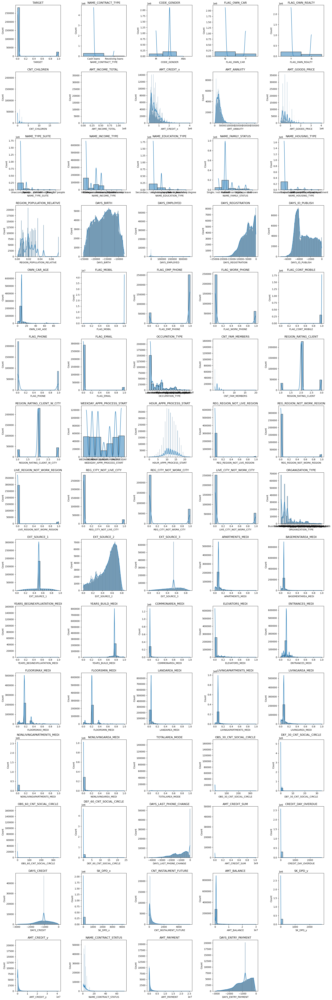

In [75]:
#univariate analysis
import math
# Get the number of columns in the dataset
num_cols = len(data.columns)

# Define the number of columns in the subplot grid
cols = 5
# Calculate the required number of rows dynamically
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(20, rows * 4))

plotnum = 1
for column in data:
    plt.subplot(rows, cols, plotnum)
    sns.histplot(data[column], kde=True)  # Adding KDE for better visualization
    plt.title(column)
    plotnum += 1
plt.tight_layout()
plt.show()

In [77]:
#Bivariate analysis
#firstly seperating the numerical data and categorical data
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

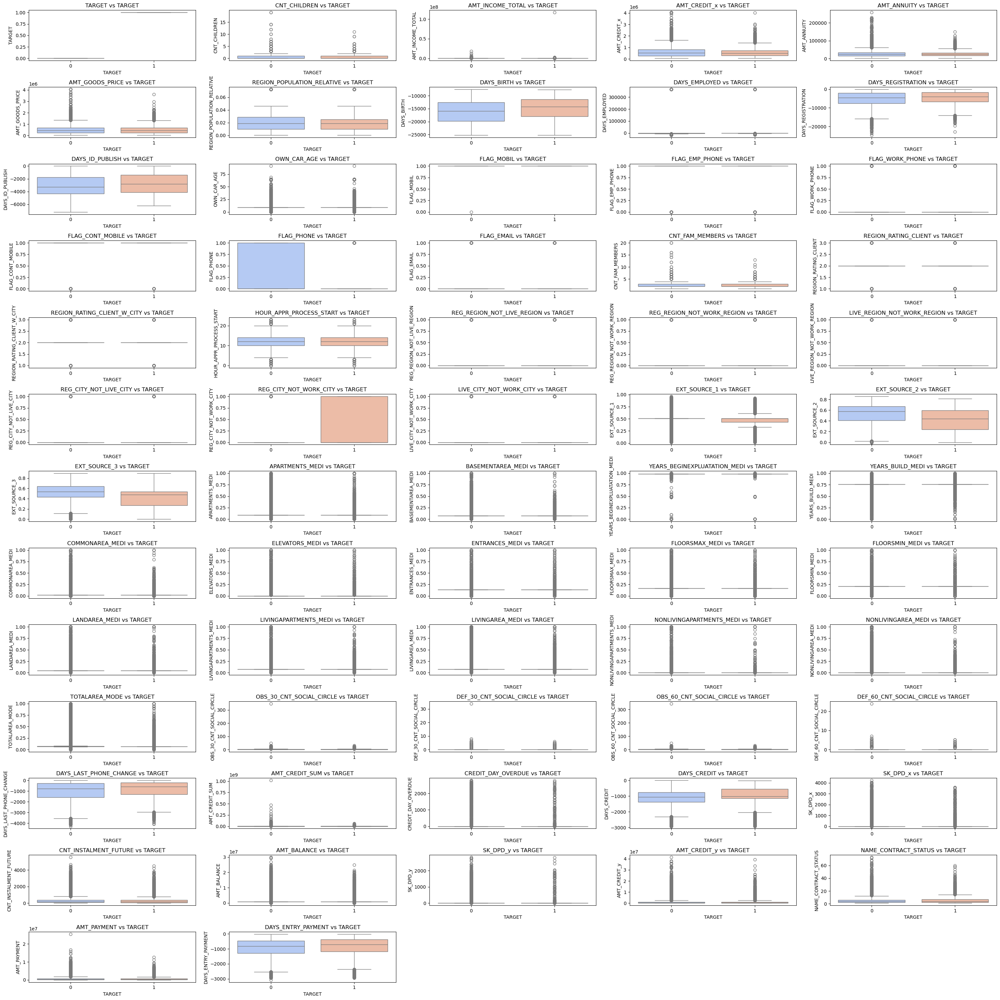

In [79]:
#Analyzing numerical data with target
plt.figure(figsize=(30, 30))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot((len(numerical_cols) // 5) + 1, 5, i)
    sns.boxplot(x=data['TARGET'], y=data[col], palette="coolwarm")
    plt.title(f"{col} vs TARGET")
plt.tight_layout()
plt.show()

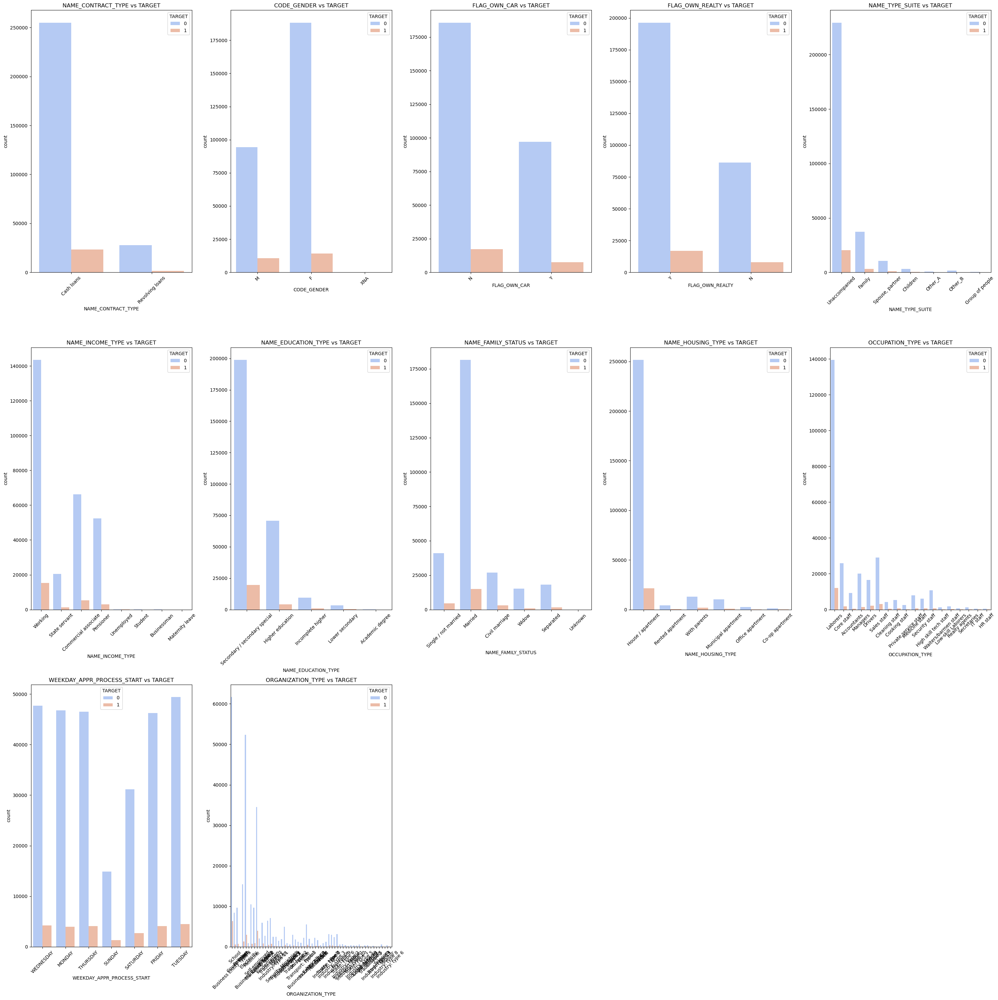

In [80]:
#Analyzing Categorical data with target
plt.figure(figsize=(30, 30))
for i, col in enumerate(categorical_cols, 1):
    plt.subplot((len(categorical_cols) // 5) + 1, 5, i)
    sns.countplot(x=data[col], hue=data['TARGET'], palette="coolwarm")
    plt.title(f"{col} vs TARGET")
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

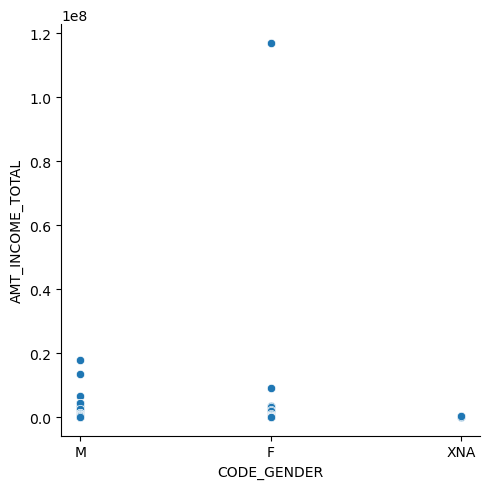

In [81]:
#Analyzing the relationships between input attributes
#Income distribution by gender
sns.relplot(x='CODE_GENDER',y='AMT_INCOME_TOTAL',data=data)
plt.show()

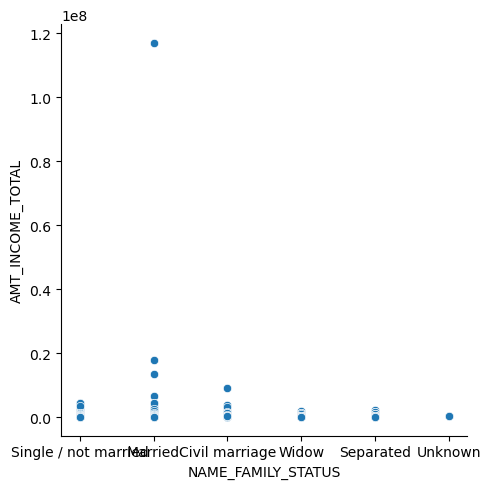

In [82]:
#Family status impact on income
sns.relplot(x='NAME_FAMILY_STATUS',y='AMT_INCOME_TOTAL',data=data)
plt.show()

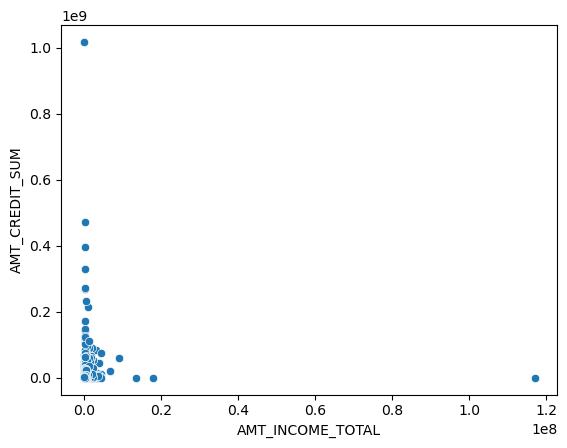

In [83]:
#How income affects loan amount
sns.scatterplot(x='AMT_INCOME_TOTAL',y='AMT_CREDIT_SUM',data=data)
plt.show()

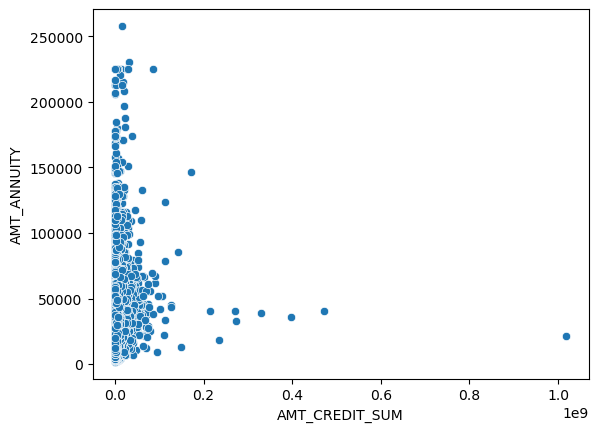

In [84]:
#Relationship between credit amount and annuity
sns.scatterplot(x='AMT_CREDIT_SUM',y='AMT_ANNUITY',data=data)
plt.show()

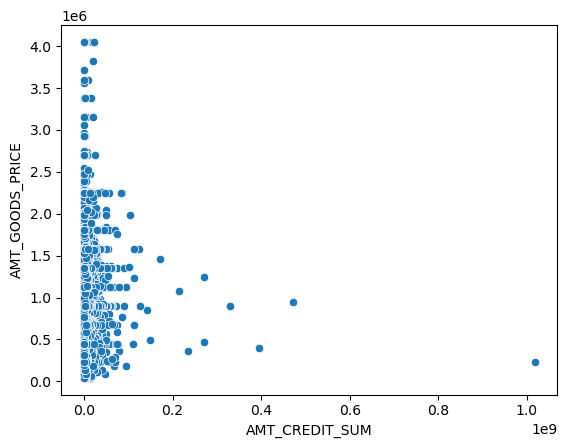

In [85]:
#Loan amount vs goods price
sns.scatterplot(x='AMT_CREDIT_SUM',y='AMT_GOODS_PRICE',data=data)
plt.show()

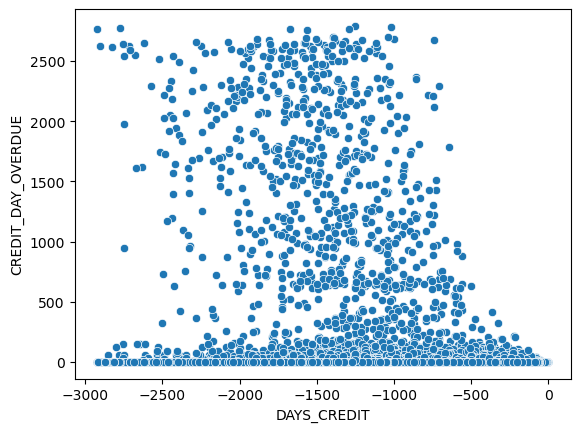

In [86]:
#Past credit behavior and overdue status
sns.scatterplot(x='DAYS_CREDIT',y='CREDIT_DAY_OVERDUE',data=data)
plt.show()

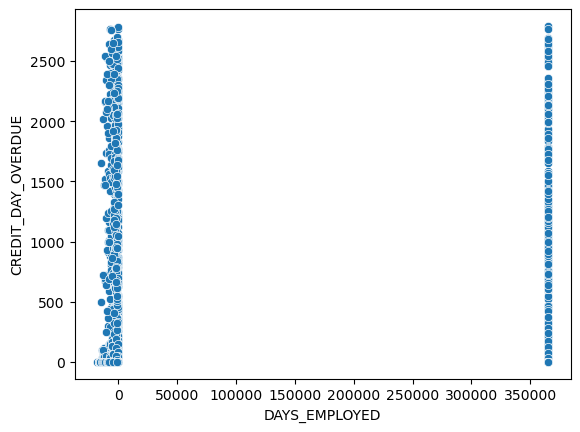

In [87]:
#Employment stability vs overdue payments
sns.scatterplot(x='DAYS_EMPLOYED',y='CREDIT_DAY_OVERDUE',data=data)
plt.show()

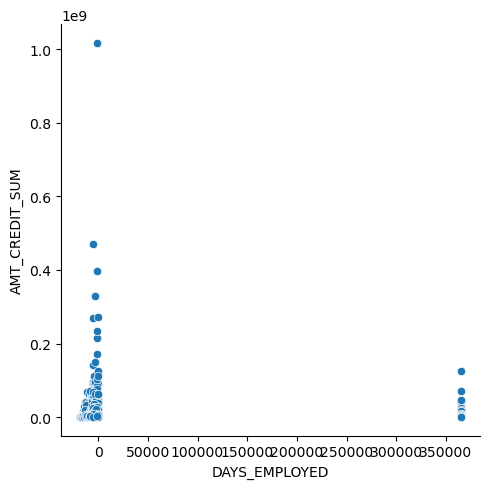

In [88]:
#Employment duration vs loan amount
sns.relplot(x='DAYS_EMPLOYED',y='AMT_CREDIT_SUM',data=data)
plt.show()

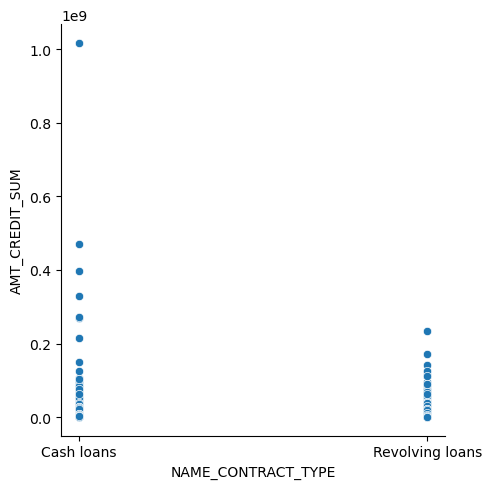

In [89]:
#Loan amount differences by contract type
sns.relplot(x='NAME_CONTRACT_TYPE',y='AMT_CREDIT_SUM',data=data)
plt.show()

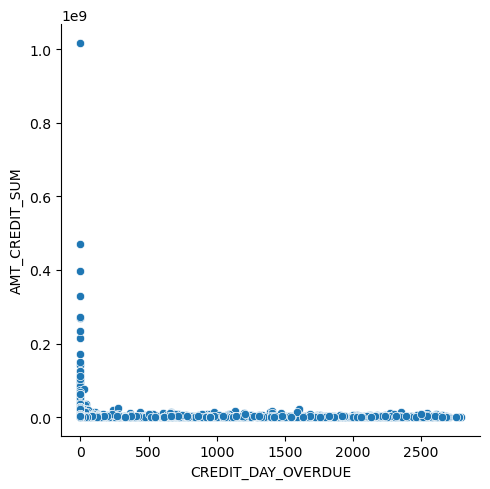

In [90]:
#Overdue payments vs total credit sum
sns.relplot(x='CREDIT_DAY_OVERDUE',y='AMT_CREDIT_SUM',data=data)
plt.show()

In this bivariate analysis, the primary objective was to explore and understand the relationships between specific variables that could potentially influence the target outcome, which is why these particular relationships were analyzed.

Multivariate analysis involves exploring relationships between three or more variables simultaneously. While it is useful for smaller datasets, it is not practical for this project due to the following reasons:

High Number of Features

Computationally Expensive & Time-Consuming

Difficult to Extract Meaningful Insights

### DATA PREPROCESSING

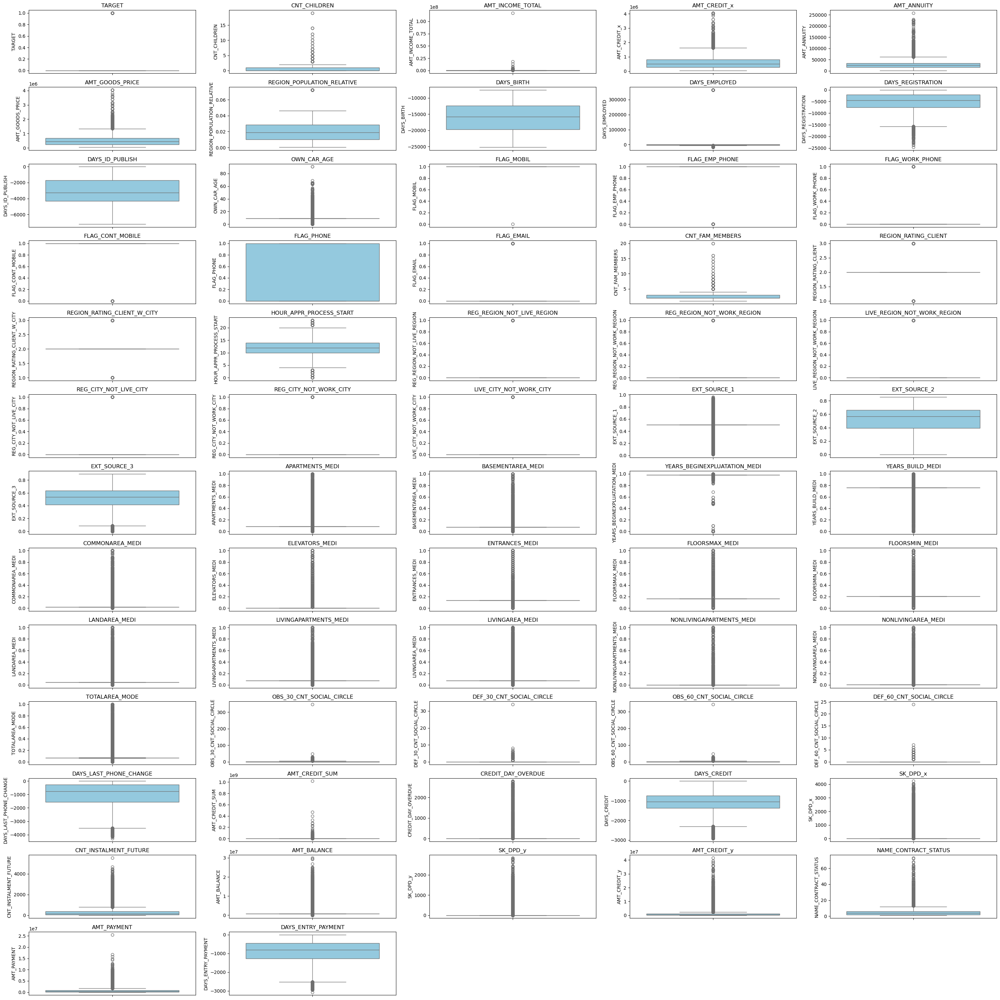

In [106]:
#Finding Outliers
plt.figure(figsize=(30, 30))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot((len(numerical_cols) // 5) + 1, 5, i)
    sns.boxplot(y=data[col], color="skyblue")
    plt.title(col)
plt.tight_layout()
plt.show()

In [107]:
from scipy.stats import zscore

# Select numerical columns (excluding TARGET)
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_cols.remove('TARGET')  # Exclude target variable

# Function to count outliers using Z-score method
def count_outliers_zscore(df, columns, threshold=3):
    outlier_dict = {}
    for col in columns:
        z_scores = zscore(df[col])  # Compute Z-scores
        outliers = df[(abs(z_scores) > threshold)]  # Count values > threshold
        outlier_dict[col] = len(outliers)
    return outlier_dict

# Count outliers in each numerical column (excluding TARGET)
outliers_found = count_outliers_zscore(data, numerical_cols)

# Print count of outliers per column
print("Outlier Count Per Column (Excluding TARGET):")
print(outliers_found)


Outlier Count Per Column (Excluding TARGET):
{'CNT_CHILDREN': 4272, 'AMT_INCOME_TOTAL': 454, 'AMT_CREDIT_x': 3255, 'AMT_ANNUITY': 2959, 'AMT_GOODS_PRICE': 4173, 'REGION_POPULATION_RELATIVE': 8412, 'DAYS_BIRTH': 0, 'DAYS_EMPLOYED': 0, 'DAYS_REGISTRATION': 749, 'DAYS_ID_PUBLISH': 0, 'OWN_CAR_AGE': 4665, 'FLAG_MOBIL': 1, 'FLAG_EMP_PHONE': 0, 'FLAG_WORK_PHONE': 0, 'FLAG_CONT_MOBILE': 574, 'FLAG_PHONE': 0, 'FLAG_EMAIL': 17442, 'CNT_FAM_MEMBERS': 4007, 'REGION_RATING_CLIENT': 0, 'REGION_RATING_CLIENT_W_CITY': 0, 'HOUR_APPR_PROCESS_START': 622, 'REG_REGION_NOT_LIVE_REGION': 4657, 'REG_REGION_NOT_WORK_REGION': 15612, 'LIVE_REGION_NOT_WORK_REGION': 12503, 'REG_CITY_NOT_LIVE_CITY': 24039, 'REG_CITY_NOT_WORK_CITY': 0, 'LIVE_CITY_NOT_WORK_CITY': 0, 'EXT_SOURCE_1': 1593, 'EXT_SOURCE_2': 0, 'EXT_SOURCE_3': 0, 'APARTMENTS_MEDI': 7028, 'BASEMENTAREA_MEDI': 5251, 'YEARS_BEGINEXPLUATATION_MEDI': 656, 'YEARS_BUILD_MEDI': 8487, 'COMMONAREA_MEDI': 4803, 'ELEVATORS_MEDI': 7446, 'ENTRANCES_MEDI': 4956, 'FLOO

In [108]:
def remove_outliers_iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

iqr_cols = ['CNT_CHILDREN', 'OWN_CAR_AGE', 'REGION_POPULATION_RELATIVE',
            'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
            'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
            'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
            'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']

# Remove extreme outliers
data_cleaned = remove_outliers_iqr(data, iqr_cols)
print("Dataset shape after IQR outlier removal:", data_cleaned.shape)

Dataset shape after IQR outlier removal: (129391, 74)


In [109]:
from scipy.stats.mstats import winsorize

winsorize_cols = ['AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
                  'AMT_CREDIT_SUM', 'AMT_BALANCE', 'AMT_PAYMENT',
                  'DAYS_CREDIT', 'DAYS_ENTRY_PAYMENT', 'DAYS_LAST_PHONE_CHANGE',
                  'SK_DPD_x', 'SK_DPD_y', 'CREDIT_DAY_OVERDUE']

for col in winsorize_cols:
    data_cleaned[col] = winsorize(data_cleaned[col], limits=[0.05, 0.05])  # Capping at 5%

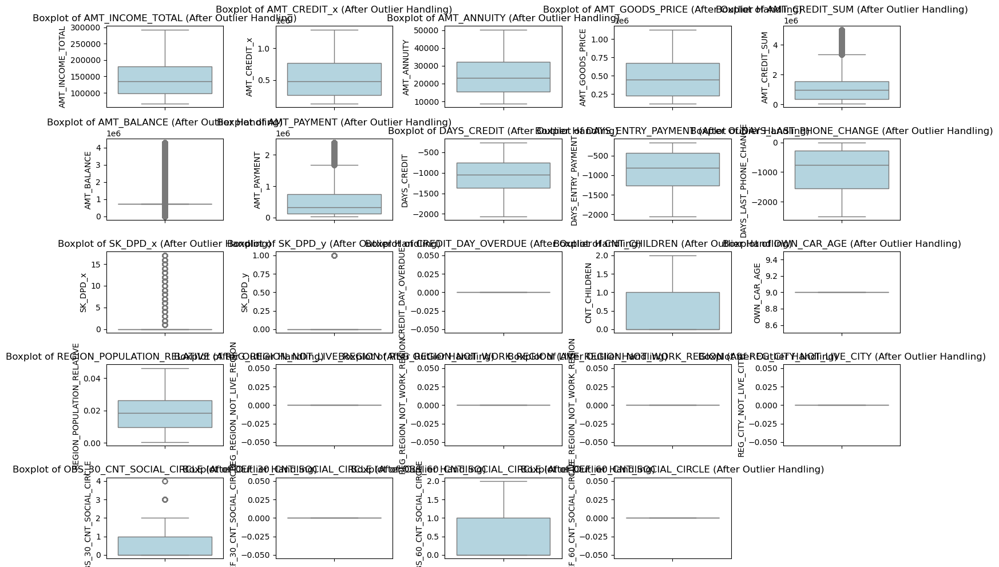

In [110]:
#checking the count whether handled or not
plt.figure(figsize=(15, 10))
for i, col in enumerate(winsorize_cols + iqr_cols, 1):
    plt.subplot((len(winsorize_cols + iqr_cols) // 5) + 1, 5, i)
    sns.boxplot(y=data_cleaned[col], color="lightblue")
    plt.title(f"Boxplot of {col} (After Outlier Handling)")
plt.tight_layout()
plt.show()

In [111]:
from scipy.stats import zscore
def count_outliers_zscore(df, columns, threshold=3):
    outlier_dict = {}
    for col in columns:
        z_scores = zscore(df[col])  # Compute Z-scores
        outliers = df[(abs(z_scores) > threshold)]  # Count values > threshold
        outlier_dict[col] = len(outliers)
    return outlier_dict

# Count outliers in cleaned data
outliers_after = count_outliers_zscore(data_cleaned, winsorize_cols + iqr_cols)
print("Outlier Count After Handling:", outliers_after)

Outlier Count After Handling: {'AMT_INCOME_TOTAL': 0, 'AMT_CREDIT_x': 0, 'AMT_ANNUITY': 0, 'AMT_GOODS_PRICE': 0, 'AMT_CREDIT_SUM': 0, 'AMT_BALANCE': 7357, 'AMT_PAYMENT': 0, 'DAYS_CREDIT': 0, 'DAYS_ENTRY_PAYMENT': 0, 'DAYS_LAST_PHONE_CHANGE': 0, 'SK_DPD_x': 7584, 'SK_DPD_y': 7120, 'CREDIT_DAY_OVERDUE': 0, 'CNT_CHILDREN': 0, 'OWN_CAR_AGE': 0, 'REGION_POPULATION_RELATIVE': 0, 'REG_REGION_NOT_LIVE_REGION': 0, 'REG_REGION_NOT_WORK_REGION': 0, 'LIVE_REGION_NOT_WORK_REGION': 0, 'REG_CITY_NOT_LIVE_CITY': 0, 'OBS_30_CNT_SOCIAL_CIRCLE': 399, 'DEF_30_CNT_SOCIAL_CIRCLE': 0, 'OBS_60_CNT_SOCIAL_CIRCLE': 0, 'DEF_60_CNT_SOCIAL_CIRCLE': 0}


I am retaining the outliers in `AMT_BALANCE`, `SK_DPD_x`, and `SK_DPD_y` because they contain crucial information about loan repayment behavior, which is essential for predicting defaults. Additionally, since I plan to use tree-based models like XGBoost and Random Forest, which are robust to outliers, removing or capping them may reduce model performance.

### FEATURE ENGINEERING

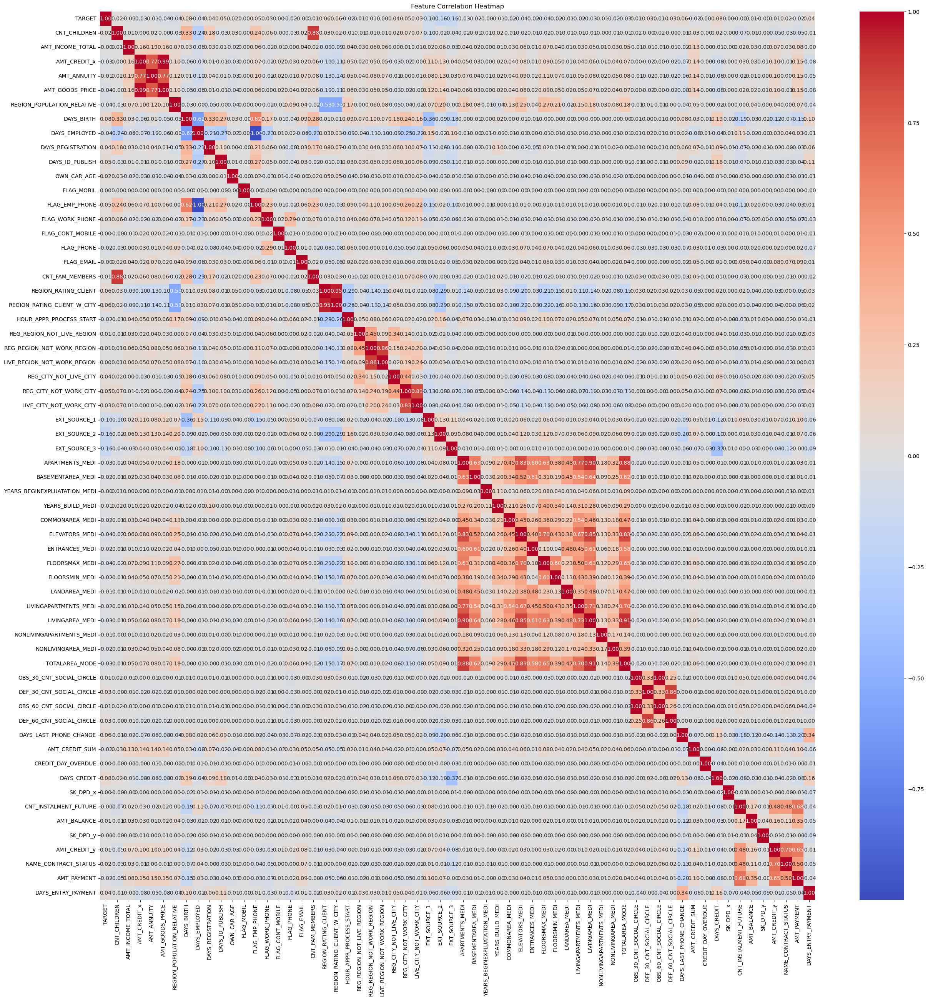

In [118]:
# Select only numerical columns
numerical_data = data.select_dtypes(include=['int64', 'float64'])  # This is a DataFrame

# Calculate the correlation matrix
corr_matrix = numerical_data.corr()  # Apply .corr() to the DataFrame, not a list
# Plot the heatmap
plt.figure(figsize=(30, 30))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
# Set title
plt.title("Feature Correlation Heatmap")
plt.show()

In [119]:
#Find Correlations with the Target
target_corr = corr_matrix['TARGET'].sort_values(ascending=False)
print("Correlations with target variable 'target':")
print(target_corr)

Correlations with target variable 'target':
TARGET                         1.000000
DAYS_CREDIT                    0.082079
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
                                 ...   
AMT_GOODS_PRICE               -0.039623
DAYS_EMPLOYED                 -0.044932
EXT_SOURCE_1                  -0.098887
EXT_SOURCE_3                  -0.155892
EXT_SOURCE_2                  -0.160295
Name: TARGET, Length: 62, dtype: float64


In [120]:
# Expand display settings to show all columns
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

# Find correlations with 'TARGET'
target_corr = corr_matrix['TARGET'].sort_values(ascending=False)

# Print full correlation list
print("Correlations with target variable 'TARGET':")
print(target_corr)

Correlations with target variable 'TARGET':
TARGET                          1.000000
DAYS_CREDIT                     0.082079
DAYS_BIRTH                      0.078239
REGION_RATING_CLIENT_W_CITY     0.060893
REGION_RATING_CLIENT            0.058899
DAYS_LAST_PHONE_CHANGE          0.055218
DAYS_ID_PUBLISH                 0.051457
REG_CITY_NOT_WORK_CITY          0.050994
FLAG_EMP_PHONE                  0.045982
REG_CITY_NOT_LIVE_CITY          0.044395
DAYS_ENTRY_PAYMENT              0.042304
DAYS_REGISTRATION               0.041975
LIVE_CITY_NOT_WORK_CITY         0.032518
DEF_30_CNT_SOCIAL_CIRCLE        0.032394
DEF_60_CNT_SOCIAL_CIRCLE        0.031401
FLAG_WORK_PHONE                 0.028524
NAME_CONTRACT_STATUS            0.020216
CNT_CHILDREN                    0.019187
OWN_CAR_AGE                     0.015982
AMT_BALANCE                     0.014439
AMT_CREDIT_y                    0.009617
OBS_30_CNT_SOCIAL_CIRCLE        0.009447
OBS_60_CNT_SOCIAL_CIRCLE        0.009337
CNT_FAM_MEMBE

In [121]:
# Find pairs with correlation > 0.8
high_corr = corr_matrix.abs().unstack().sort_values(ascending=False)
high_corr = high_corr[high_corr >= 0.8]  # Threshold for strong correlation
print("Highly correlated feature pairs:")
print(high_corr)

Highly correlated feature pairs:
TARGET                        TARGET                          1.000000
APARTMENTS_MEDI               APARTMENTS_MEDI                 1.000000
EXT_SOURCE_2                  EXT_SOURCE_2                    1.000000
EXT_SOURCE_1                  EXT_SOURCE_1                    1.000000
LIVE_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY         1.000000
REG_CITY_NOT_WORK_CITY        REG_CITY_NOT_WORK_CITY          1.000000
REG_CITY_NOT_LIVE_CITY        REG_CITY_NOT_LIVE_CITY          1.000000
LIVE_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION     1.000000
REG_REGION_NOT_WORK_REGION    REG_REGION_NOT_WORK_REGION      1.000000
REG_REGION_NOT_LIVE_REGION    REG_REGION_NOT_LIVE_REGION      1.000000
HOUR_APPR_PROCESS_START       HOUR_APPR_PROCESS_START         1.000000
REGION_RATING_CLIENT_W_CITY   REGION_RATING_CLIENT_W_CITY     1.000000
REGION_RATING_CLIENT          REGION_RATING_CLIENT            1.000000
CNT_FAM_MEMBERS               CNT_FAM_MEMBER

In [122]:
#removing highly correlated variables (dropping them)
columns_to_drop = [
    'AMT_GOODS_PRICE', 'REGION_RATING_CLIENT', 'TOTALAREA_MODE',
    'APARTMENTS_MEDI', 'CNT_CHILDREN', 'DEF_60_CNT_SOCIAL_CIRCLE'
]
data = data.drop(columns=columns_to_drop)
print("Dataset shape after removing highly correlated features:", data.shape)

Dataset shape after removing highly correlated features: (307511, 68)


We removed highly correlated features to eliminate redundancy and improve model efficiency. Keeping highly correlated variables can introduce multicollinearity, which affects model stability and interpretability. By dropping these features, we retained only the most relevant predictors, ensuring better generalization and performance.

In [124]:
# Checking categorical cols for applying encoding
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
print("Categorical Columns:", categorical_cols)

Categorical Columns: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE']


In [131]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
import pickle
from sklearn.pipeline import Pipeline

In [133]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()

In [135]:
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
print(numerical_cols)

['TARGET', 'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_CREDIT_SUM', 'CREDIT_DAY_OVERDUE', 'DA

In [139]:
#The columns are given to the encoders and scalers accordingly
standard_scaler = ['REGION_POPULATION_RELATIVE', 'HOUR_APPR_PROCESS_START']
minmax_scaler = ['AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY', 'AMT_CREDIT_SUM', 'AMT_BALANCE',
    'AMT_CREDIT_y', 'AMT_PAYMENT', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
    'DAYS_ID_PUBLISH', 'DAYS_CREDIT', 'DAYS_LAST_PHONE_CHANGE', 'DAYS_ENTRY_PAYMENT',
    'CNT_FAM_MEMBERS', 'CNT_INSTALMENT_FUTURE', 'OBS_30_CNT_SOCIAL_CIRCLE',
    'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'CREDIT_DAY_OVERDUE',
    'SK_DPD_x', 'SK_DPD_y']
frequency_encoder = ['ORGANIZATION_TYPE']
ordinal_encoder = ['NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START',
                  'NAME_CONTRACT_STATUS','OCCUPATION_TYPE']
target_encoder = ['OCCUPATION_TYPE']
label_encoder = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']
passthrough = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',  # Already normalized features
    'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',  # Binary features
    'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
               'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',  # Binary region indicators
    'NAME_CONTRACT_STATUS' ] # Categorical (already encoded)

In [141]:
#code to do label encoding
class ModifiedLabelEncoder(LabelEncoder):
    def fit_transform(self, y, *args, **kwargs):
        return super().fit_transform(y).reshape(-1, 1)
    def transform(self, y, *args, **kwargs):
        return super().transform(y).reshape(-1, 1)

In [143]:
#code to do frequency encoding
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column
        self.mapping = {}
    def fit(self, X, y=None):
        # Calculate frequency encoding mapping for the column
        value_counts = X[self.column].value_counts()
        sorted_values = sorted(value_counts.items(), key=lambda x: x[1])
        self.mapping = {value: idx for idx, (value, _) in enumerate(sorted_values)}
        return self
    def transform(self, X):
        # Apply frequency encoding based on the fitted mapping
        X_encoded = X.copy()
        X_encoded[self.column] = X_encoded[self.column].map(self.mapping)
        return X_encoded

In [145]:
from category_encoders import TargetEncoder
class CustomTargetEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column
        self.encoder = TargetEncoder()
    def fit(self, X, y):
        self.encoder.fit(X[[self.column]], y)  # Fit on the categorical column and target variable
        return self
    def transform(self, X):
        X_encoded = X.copy()
        X_encoded[self.column] = self.encoder.transform(X_encoded[[self.column]]).squeeze()  # Apply encoding
        return X_encoded

In [147]:
#code for Ordinal Encoder
from sklearn.preprocessing import OrdinalEncoder
class CustomOrdinalEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column, categories):
        self.column = column
        self.categories = categories  # Define the specific order
        self.encoder = OrdinalEncoder(categories=[categories], handle_unknown="use_encoded_value", unknown_value=-1)
    def fit(self, X, y=None):
        self.encoder.fit(X[[self.column]])  # Fit on the specified column
        return self
    def transform(self, X):
        X_encoded = X.copy()
        X_encoded[self.column] = self.encoder.transform(X_encoded[[self.column]]).astype(int)  # Apply encoding
        return X_encoded

In [149]:
ordinal_mappings = {
    'NAME_TYPE_SUITE': ['Unaccompanied', 'Family', 'Spouse, partner', 'Children', 'Other_A', 'Other_B', 'Group of people'],
    'NAME_INCOME_TYPE': ['Student', 'Pensioner', 'Unemployed', 'Working', 'Commercial associate', 'State servant', 'Businessman', 'Maternity leave'],
    'NAME_EDUCATION_TYPE': ['Lower secondary', 'Secondary / secondary special', 'Incomplete higher', 'Higher education', 'Academic degree'],
    'NAME_FAMILY_STATUS': ['Single / not married', 'Separated', 'Widow', 'Civil marriage', 'Married'],
    'NAME_HOUSING_TYPE': ['Rented apartment', 'With parents', 'Municipal apartment', 'Office apartment', 'Co-op apartment', 'House / apartment'],
    'WEEKDAY_APPR_PROCESS_START': ['MONDAY', 'TUESDAY', 'WEDNESDAY', 'THURSDAY', 'FRIDAY', 'SATURDAY', 'SUNDAY'],
    'NAME_CONTRACT_STATUS': ['Approved', 'Unused offer', 'Canceled', 'Refused']
}

In [151]:
def same(x):
    return x

In [153]:
no_trans=FunctionTransformer(same)

In [155]:
from category_encoders import TargetEncoder
target_encoder = TargetEncoder()
data['OCCUPATION_TYPE'] = target_encoder.fit_transform(data['OCCUPATION_TYPE'], data['TARGET'])  # Fit with y

In [157]:
# Define the column transformer with all encoders and scalers
preprocessor = ColumnTransformer([
    ("Standard_scaler", StandardScaler(), standard_scaler), 
    ("MinMax_scaler",MinMaxScaler(),minmax_scaler),
    ("Ordinal_encoder", OrdinalEncoder(), ordinal_encoder),  # Ordinal Encoding
    ("Label_encoder", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1), label_encoder),  # Label Encoding
    ("Frequency_encoder", FrequencyEncoder(column="ORGANIZATION_TYPE"), ['ORGANIZATION_TYPE']),  # Frequency Encoding
    ("Pass_through",no_trans,passthrough)  # Keep these columns unchanged
])

In [159]:
# Fit and transform the data
transformed_data = preprocessor.fit_transform(data)
# Print transformed data
print("Transformed data shape:", transformed_data.shape)
print("Preview of transformed data:")
print(transformed_data[:5])

Transformed data shape: (307511, 53)
Preview of transformed data:
[[-1.49452213e-01 -6.31821252e-01  1.51186991e-03  9.02865169e-02
   9.00315900e-02  8.49795016e-04  2.87172447e-02  4.31862346e-03
   8.60027538e-03  8.88838782e-01  4.50861923e-02  8.52140078e-01
   7.05432819e-01  7.00889802e-01  7.35787512e-01  8.98167845e-01
   0.00000000e+00  5.14533309e-02  5.74712644e-03  5.88235294e-02
   5.81395349e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
   6.00000000e+00  7.00000000e+00  4.00000000e+00  3.00000000e+00
   1.00000000e+00  6.00000000e+00  0.00000000e+00  1.00000000e+01
   0.00000000e+00  1.00000000e+00  0.00000000e+00  1.00000000e+00
   5.70000000e+01  8.30369674e-02  2.62948593e-01  1.39375780e-01
   1.00000000e+00  1.00000000e+00  0.00000000e+00  1.00000000e+00
   1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   1.00000000e+00]
 [-1.25275029e+00 -3.25620092e-01  2.08891949e-03  3.1173

In [160]:
preprocessor

ColumnTransformer(transformers=[('Standard_scaler', StandardScaler(),
                                 ['REGION_POPULATION_RELATIVE',
                                  'HOUR_APPR_PROCESS_START']),
                                ('MinMax_scaler', MinMaxScaler(),
                                 ['AMT_INCOME_TOTAL', 'AMT_CREDIT_x',
                                  'AMT_ANNUITY', 'AMT_CREDIT_SUM',
                                  'AMT_BALANCE', 'AMT_CREDIT_y', 'AMT_PAYMENT',
                                  'DAYS_BIRTH', 'DAYS_EMPLOYED',
                                  'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
                                  'DAYS_CREDIT', 'D...
                                 FunctionTransformer(func=<function same at 0x0000023C25FFE340>),
                                 ['EXT_SOURCE_1', 'EXT_SOURCE_2',
                                  'EXT_SOURCE_3', 'FLAG_MOBIL',
                                  'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
                                  'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                                  'FLAG_EMAIL', 'REG_REGION_NOT_LIVE_REGION',
                                  'REG_REGION_NOT_WORK_REGION',
                                  'LIVE_REGION_NOT_WORK_REGION',
                                  'REG_CITY_NOT_LIVE_CITY',
                                  'REG_CITY_NOT_WORK_CITY',
                                  'LIVE_CITY_NOT_WORK_CITY',
                                  'NAME_CONTRACT_STATUS'])])

In [163]:
# Fit and transform the data using the preprocessor
transformed_data = preprocessor.fit_transform(data)
# Print the transformed data
print(transformed_data)

[[-1.49452213e-01 -6.31821252e-01  1.51186991e-03 ...  0.00000000e+00
   0.00000000e+00  1.00000000e+00]
 [-1.25275029e+00 -3.25620092e-01  2.08891949e-03 ...  0.00000000e+00
   0.00000000e+00  3.00000000e+00]
 [-7.83450959e-01 -9.38022412e-01  3.57770742e-04 ...  0.00000000e+00
   0.00000000e+00  1.00000000e+00]
 ...
 [-1.14711999e+00 -9.38022412e-01  1.08870022e-03 ...  1.00000000e+00
   1.00000000e+00  2.00000000e+00]
 [-1.12463468e+00 -9.38022412e-01  1.24258010e-03 ...  1.00000000e+00
   0.00000000e+00  2.00000000e+00]
 [ 1.83294163e+00  2.43019035e+00  1.12717019e-03 ...  1.00000000e+00
   1.00000000e+00  8.00000000e+00]]


In [164]:
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Columns: {columns}")

Transformer: Standard_scaler, Columns: ['REGION_POPULATION_RELATIVE', 'HOUR_APPR_PROCESS_START']
Transformer: MinMax_scaler, Columns: ['AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY', 'AMT_CREDIT_SUM', 'AMT_BALANCE', 'AMT_CREDIT_y', 'AMT_PAYMENT', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_CREDIT', 'DAYS_LAST_PHONE_CHANGE', 'DAYS_ENTRY_PAYMENT', 'CNT_FAM_MEMBERS', 'CNT_INSTALMENT_FUTURE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'CREDIT_DAY_OVERDUE', 'SK_DPD_x', 'SK_DPD_y']
Transformer: Ordinal_encoder, Columns: ['NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'NAME_CONTRACT_STATUS', 'OCCUPATION_TYPE']
Transformer: Label_encoder, Columns: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']
Transformer: Frequency_encoder, Columns: ['ORGANIZATION_TYPE']
Transformer: Pass_through, Columns: ['EXT_SOURCE_1'

In [167]:
# Print a preview of the transformed data
print("Preview of transformed data:")
print(transformed_data[:5])  # Show first 5 rows
# Check data type of transformed_data
if isinstance(transformed_data, np.ndarray):
    print("Data is encoded: Transformed data is a NumPy array.")
else:
    print("Data is not properly encoded.")
# Verify specific transformations
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Applied on Columns: {columns}")

Preview of transformed data:
[[-1.49452213e-01 -6.31821252e-01  1.51186991e-03  9.02865169e-02
   9.00315900e-02  8.49795016e-04  2.87172447e-02  4.31862346e-03
   8.60027538e-03  8.88838782e-01  4.50861923e-02  8.52140078e-01
   7.05432819e-01  7.00889802e-01  7.35787512e-01  8.98167845e-01
   0.00000000e+00  5.14533309e-02  5.74712644e-03  5.88235294e-02
   5.81395349e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
   6.00000000e+00  7.00000000e+00  4.00000000e+00  3.00000000e+00
   1.00000000e+00  6.00000000e+00  0.00000000e+00  1.00000000e+01
   0.00000000e+00  1.00000000e+00  0.00000000e+00  1.00000000e+00
   5.70000000e+01  8.30369674e-02  2.62948593e-01  1.39375780e-01
   1.00000000e+00  1.00000000e+00  0.00000000e+00  1.00000000e+00
   1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   1.00000000e+00]
 [-1.25275029e+00 -3.25620092e-01  2.08891949e-03  3.11735955e-01
   1.32923833e-01  9.9945241

In [169]:
import pickle   # For saving and loading machine learning models
from sklearn.model_selection import train_test_split  # For splitting the data into training and testing
from preprocessor import *  # To import all preprocessor functions at once
from imblearn.over_sampling import SMOTE  # For balancing the data
import warnings

### Task 2:-Create a predictive model to identify the factors / customer segments that are eligible for taking loan.

### Model Building

In [173]:
# Final feature set
X = data.drop('TARGET', axis=1)  # Features
y = data['TARGET']  # Target

In [175]:
# Spliting the data into train and test
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=33)

In [177]:
print(x_train.columns)

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'BASEMENTAREA_MEDI',
       'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',
  

In [179]:
# Transform the training data using the preprocessor object or PipeLine
processed_x_train = preprocessor.fit_transform(x_train)
processed_x_test = preprocessor.fit_transform(x_test)

In [181]:
from sklearn.utils.class_weight import compute_sample_weight
sample_weights = compute_sample_weight(class_weight={0:1,1:5},y=y_train)  # You need to define this function
# based on weights the inputs are given preference, hightest weight hightest preference
# while in y=mx+c
# m represents slope where as here we consider it as weight
# smote technique can also be used
# the ratios may differ

In [183]:
import time
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_sample_weight

### 1.Logistic Regression

In [186]:
from sklearn.model_selection import GridSearchCV
log_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'solver': ['liblinear', 'lbfgs']  # Optimization algorithms
}
log_grid = GridSearchCV(LogisticRegression(class_weight='balanced', random_state=42), 
                        log_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
log_grid.fit(processed_x_train, y_train)
print("Best Parameters for Logistic Regression:", log_grid.best_params_)
# Train final Logistic Regression model
best_log_model = LogisticRegression(**log_grid.best_params_, class_weight='balanced', random_state=42)
best_log_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters for Logistic Regression: {'C': 1, 'solver': 'liblinear'}


LogisticRegression(C=1, class_weight='balanced', random_state=42,
                   solver='liblinear')

In [188]:
# Train Logistic Regression with Best Parameters
best_log_model = LogisticRegression(C=1, solver='liblinear', class_weight='balanced', random_state=42)
best_log_model.fit(processed_x_train, y_train)

LogisticRegression(C=1, class_weight='balanced', random_state=42,
                   solver='liblinear')

In [189]:
y_predict = best_log_model.predict(processed_x_test)

In [190]:
y_predict

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

 Logistic Regression Accuracy: 0.6940867348266084

 Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.96      0.70      0.81     70614
           1       0.16      0.65      0.26      6264

    accuracy                           0.69     76878
   macro avg       0.56      0.67      0.53     76878
weighted avg       0.89      0.69      0.76     76878



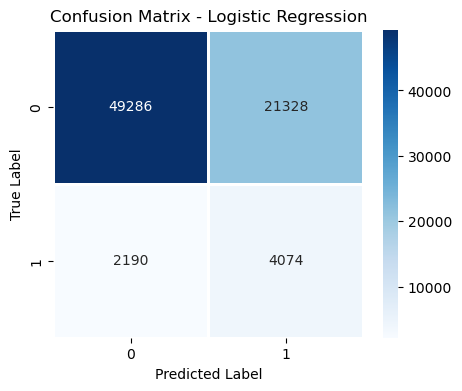

In [191]:
# Now, Evaluate Model Performance
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Calculate Accuracy
log_accuracy = accuracy_score(y_test, y_predict)
print(" Logistic Regression Accuracy:", log_accuracy)
#  Print Classification Report
print("\n Classification Report for Logistic Regression:")
print(classification_report(y_test, y_predict))
#  Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

### 2.Decision Tree

In [201]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
# Define parameter grid
param_grid = {
    'max_depth': [3, 5, 10, 20],  # Control depth to avoid overfitting
    'min_samples_split': [10, 20, 50],  # Minimum samples to split a node
    'min_samples_leaf': [5, 10, 20],  # Minimum samples per leaf node
    'criterion': ['gini', 'entropy']  # Try different split criteria
}
# Perform GridSearchCV
dt_grid = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, 
                       cv=5, scoring='roc_auc', n_jobs=-1, verbose=2)
# Fit model on training data
dt_grid.fit(processed_x_train, y_train)
# Best parameters
print("Best Parameters for Decision Tree:", dt_grid.best_params_)
# Train final Decision Tree with best parameters
best_dt_model = DecisionTreeClassifier(**dt_grid.best_params_, random_state=42)
best_dt_model.fit(processed_x_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters for Decision Tree: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 50}


DecisionTreeClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=50,
                       random_state=42)

In [202]:
# Predict
y_pred_dt = best_dt_model.predict(processed_x_test)
y_pred_dt

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Decision Tree Accuracy: 0.9137074325554775

 Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95     70614
           1       0.25      0.03      0.05      6264

    accuracy                           0.91     76878
   macro avg       0.59      0.51      0.50     76878
weighted avg       0.87      0.91      0.88     76878



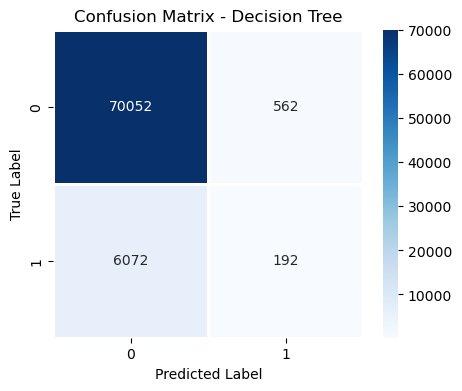

In [203]:
# Evaluate Decision Tree
dt_accuracy = accuracy_score(y_test, y_pred_dt)
print(" Decision Tree Accuracy:", dt_accuracy)
print("\n Classification Report for Decision Tree:")
print(classification_report(y_test, y_pred_dt))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Decision Tree")
plt.show()

### 3.Random Forest

In [207]:
from sklearn.model_selection import GridSearchCV
# Define Hyperparameters for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20]
}
# Train Random Forest with GridSearchCV
rf_grid = GridSearchCV(RandomForestClassifier(class_weight='balanced', random_state=42),
                       rf_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
rf_grid.fit(processed_x_train, y_train)
print("Best Parameters for Random Forest:", rf_grid.best_params_)
# Train Final Random Forest Model
best_rf_model = RandomForestClassifier(**rf_grid.best_params_, class_weight='balanced', random_state=42)
best_rf_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
Best Parameters for Random Forest: {'max_depth': None, 'n_estimators': 100}


RandomForestClassifier(class_weight='balanced', random_state=42)

In [208]:
# Predict
y_pred_rf = best_rf_model.predict(processed_x_test)
y_pred_rf

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Random Forest Accuracy: 0.9185202528681807

 Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     70614
           1       0.00      0.00      0.00      6264

    accuracy                           0.92     76878
   macro avg       0.46      0.50      0.48     76878
weighted avg       0.84      0.92      0.88     76878



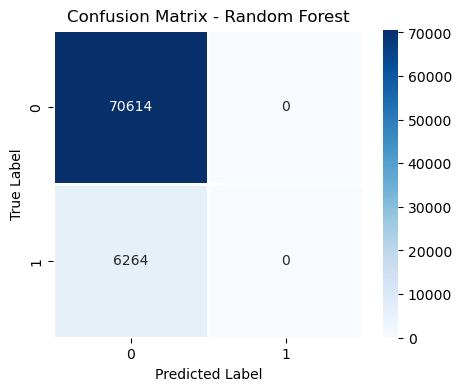

In [209]:
# Evaluate Random Forest
rf_accuracy = accuracy_score(y_test, y_pred_rf)
print(" Random Forest Accuracy:", rf_accuracy)
print("\n Classification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Random Forest")
plt.show()

### 4.Gradient Boosting

In [214]:
# Define Hyperparameters for Gradient Boosting
gb_param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.1]
}
# Train Gradient Boosting with GridSearchCV
gb_grid = GridSearchCV(GradientBoostingClassifier(random_state=42),
                       gb_param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=2)
gb_grid.fit(processed_x_train, y_train)
print("Best Parameters for Gradient Boosting:", gb_grid.best_params_)
# Train Final Gradient Boosting Model
best_gb_model = GradientBoostingClassifier(**gb_grid.best_params_, random_state=42)
best_gb_model.fit(processed_x_train, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best Parameters for Gradient Boosting: {'learning_rate': 0.1, 'n_estimators': 100}


GradientBoostingClassifier(random_state=42)

In [215]:
# Predict
y_pred_gb = best_gb_model.predict(processed_x_test)
y_pred_gb

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 Gradient Boosting Accuracy: 0.9189885272769843

 Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     70614
           1       0.63      0.01      0.03      6264

    accuracy                           0.92     76878
   macro avg       0.77      0.51      0.49     76878
weighted avg       0.90      0.92      0.88     76878



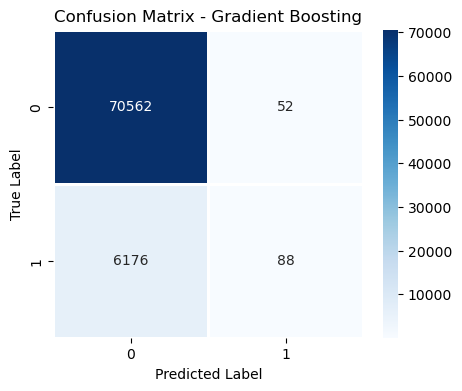

In [216]:
# Evaluate Gradient Boosting
gb_accuracy = accuracy_score(y_test, y_pred_gb)
print(" Gradient Boosting Accuracy:", gb_accuracy)
print("\n Classification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred_gb))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_gb), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

### 5.XGboost

In [220]:
## model creation
from xgboost import XGBClassifier#importing the model library
xgb_r=XGBClassifier() ## object creation
xgb_r.fit(processed_x_train,y_train,sample_weight=sample_weights)# fitting the data
y_hat=xgb_r.predict(processed_x_test)

 XGBoost Accuracy: 0.8643

 Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93     70614
           1       0.23      0.29      0.26      6264

    accuracy                           0.86     76878
   macro avg       0.58      0.60      0.59     76878
weighted avg       0.88      0.86      0.87     76878



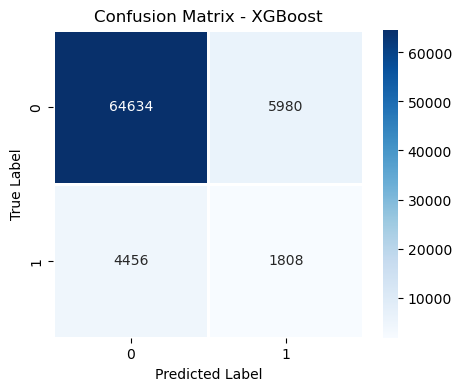

In [222]:
## Model Evaluation
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Calculate Accuracy
xgb_accuracy = accuracy_score(y_test, y_hat)
print(f" XGBoost Accuracy: {xgb_accuracy:.4f}")
#  Print Classification Report
print("\n Classification Report for XGBoost:")
print(classification_report(y_test, y_hat))
#  Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_hat), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - XGBoost")
plt.show()

## MODEL COMPARISION REPORT


 Model Performance Comparison:
Gradient Boosting: 0.9190
Random Forest: 0.9185
Decision Tree: 0.9137
XGBoost: 0.8643
Logistic Regression: 0.6941


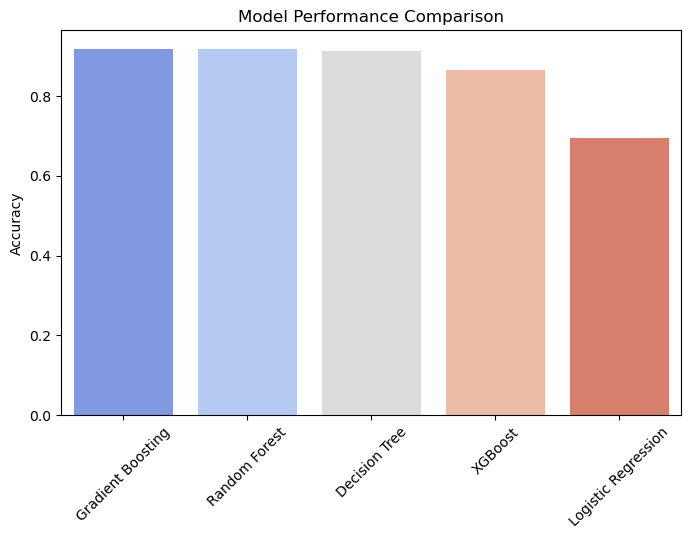

In [226]:
# Store model results
model_results = {
    "Logistic Regression": log_accuracy,
    "Decision Tree": dt_accuracy,
    "Random Forest": rf_accuracy,
    "Gradient Boosting": gb_accuracy,
    "XGBoost": xgb_accuracy
}

# Sort models by accuracy
sorted_results = sorted(model_results.items(), key=lambda x: x[1], reverse=True)
print("\n Model Performance Comparison:")
for model, acc in sorted_results:
    print(f"{model}: {acc:.4f}")

# Plot Model Comparison
plt.figure(figsize=(8, 5))
sns.barplot(x=[m[0] for m in sorted_results], y=[m[1] for m in sorted_results], palette="coolwarm")
plt.xticks(rotation=45)
plt.ylabel("Accuracy")
plt.title("Model Performance Comparison")
plt.show()

### MODEL REPORT